In [1]:
%pylab inline 

Populating the interactive namespace from numpy and matplotlib


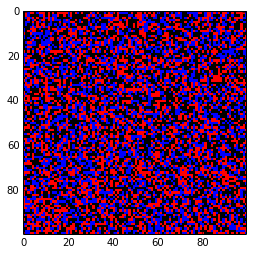

In [5]:

# make values from -5 to 5, for this example
zvals = np.random.rand(100,100)*10-5

# make a color map of fixed colors
cmap = mpl.colors.ListedColormap(['blue','black','red'])
bounds=[-6,-2,2,6]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# tell imshow about color map so that only set colors are used
img = pyplot.imshow(zvals,interpolation='nearest',
                    cmap = cmap,norm=norm)

pyplot.show()

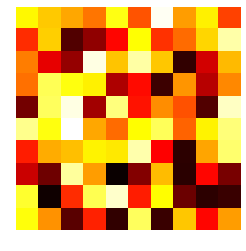

In [15]:
data = random.random((10,10))
fig = plt.imshow(data,interpolation='nearest')
fig.set_cmap('hot')
plt.axis('off')
plt.savefig("test.png",bbox_inches='tight')

Nice cmaps http://matplotlib.org/examples/color/colormaps_reference.html

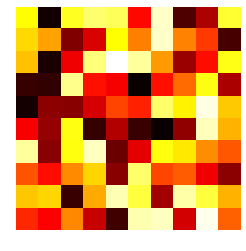

In [27]:
for i in np.arange(10):
    data = random.random((10,10))
    fig = plt.imshow(data,interpolation='nearest')
    fig.set_cmap('hot')
    plt.axis('off')
    plt.savefig("cmap_hot_large{}.png".format(i),bbox_inches='tight')

### Empty Entropy field then add entropy 

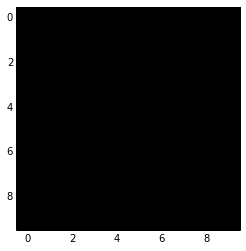

In [76]:
mega_data =[]
data = np.zeros_like(random.random((10,10)))
amp=0.1
fig = plt.imshow(data,interpolation='nearest')
plt.savefig("increasing_entropy_large0.png",bbox_inches='tight')
fig.set_cmap('gray')
for i in np.arange(10):
    data += random.random((10,10))*amp*i
    mega_data.append(data)

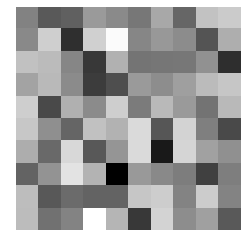

In [77]:
i=0
for data in mega_data:
    i+=1
    plt.axis('off')
    plt.imshow(data,interpolation='nearest',cmap='gray')
    plt.savefig("increasing_entropy_large{}.png".format(i),bbox_inches='tight')

Gallery of tweetable program (Wolfram)

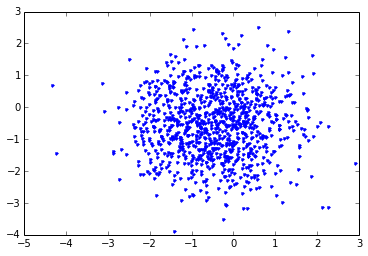

In [34]:
samples = multivariate_normal([-0.5, -0.5], [[1, 0],[0, 1]], 1000)
plot(samples[:, 0], samples[:, 1], '.')

### Growing entropy 

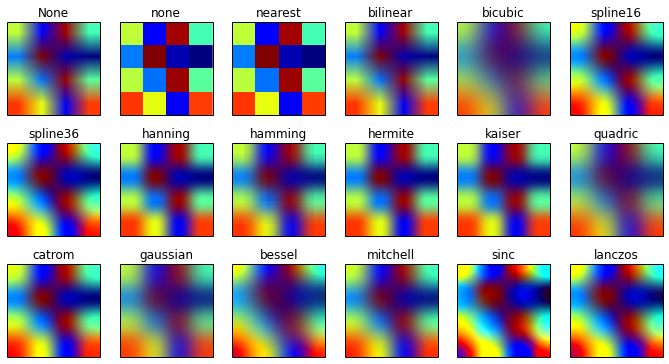

In [35]:
methods = [None, 'none', 'nearest', 'bilinear', 'bicubic', 'spline16',
           'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric',
           'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos']

grid = np.random.rand(4, 4)

fig, axes = plt.subplots(3, 6, figsize=(12, 6),
                         subplot_kw={'xticks': [], 'yticks': []})

fig.subplots_adjust(hspace=0.3, wspace=0.05)

for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(grid, interpolation=interp_method)
    ax.set_title(interp_method)

plt.show()

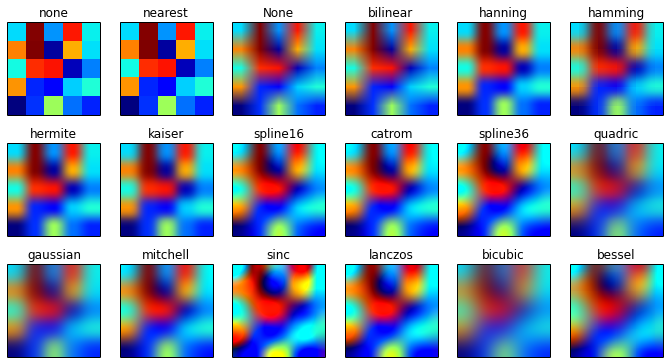

In [60]:
methods = [ 'none', 'nearest', None, 'bilinear', 'hanning', 'hamming', 'hermite', 'kaiser', 'spline16','catrom','spline36',  'quadric', 'gaussian', 'mitchell', 'sinc', 'lanczos','bicubic', 'bessel']
grid = np.random.rand(5, 5)

fig, axes = plt.subplots(3, 6, figsize=(12, 6),
                         subplot_kw={'xticks': [], 'yticks': []})

fig.subplots_adjust(hspace=0.3, wspace=0.05)
n=0
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(grid, interpolation=interp_method)
    ax.set_title(interp_method)
    plt.savefig("growing_entropy_5x5_{}.png".format(n))
    n+=1
plt.show()

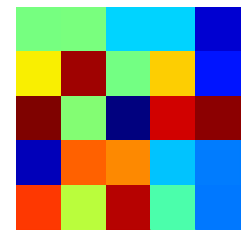

In [62]:
methods =[ 'none', 'nearest', None, 'bilinear', 'hanning', 'hamming', 'hermite', 'kaiser', 'spline16','catrom','spline36',  'quadric', 'gaussian', 'mitchell','bicubic', 'bessel']
grid = np.random.rand(5, 5)

# fig, axes = plt.subplots(3, 6, figsize=(12, 6),
#                          subplot_kw={'xticks': [], 'yticks': []})

fig.subplots_adjust(hspace=0.3, wspace=0.05)
n=0
for interp_method in methods: #zip(methods):
    plt.axis("off")
    plt.imshow(grid, interpolation=interp_method)
    plt.savefig("growing_entropy_5x5_{}.png".format(n))
    n+=1
n=0
for interp_method in reversed(methods): #zip(methods):
    plt.axis("off")
    plt.imshow(grid, interpolation=interp_method)
    plt.savefig("decreasing_entropy_5x5_{}.png".format(n))
    n+=1

#### Voroni diagram

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi

def voronoi_finite_polygons_2d(vor, radius=None):
    """
    Reconstruct infinite voronoi regions in a 2D diagram to finite
    regions.

    Parameters
    ----------
    vor : Voronoi
        Input diagram
    radius : float, optional
        Distance to 'points at infinity'.

    Returns
    -------
    regions : list of tuples
        Indices of vertices in each revised Voronoi regions.
    vertices : list of tuples
        Coordinates for revised Voronoi vertices. Same as coordinates
        of input vertices, with 'points at infinity' appended to the
        end.

    """

    if vor.points.shape[1] != 2:
        raise ValueError("Requires 2D input")

    new_regions = []
    new_vertices = vor.vertices.tolist()

    center = vor.points.mean(axis=0)
    if radius is None:
        radius = vor.points.ptp().max()

    # Construct a map containing all ridges for a given point
    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    # Reconstruct infinite regions
    for p1, region in enumerate(vor.point_region):
        vertices = vor.regions[region]

        if all(v >= 0 for v in vertices):
            # finite region
            new_regions.append(vertices)
            continue

        # reconstruct a non-finite region
        ridges = all_ridges[p1]
        new_region = [v for v in vertices if v >= 0]

        for p2, v1, v2 in ridges:
            if v2 < 0:
                v1, v2 = v2, v1
            if v1 >= 0:
                # finite ridge: already in the region
                continue

            # Compute the missing endpoint of an infinite ridge

            t = vor.points[p2] - vor.points[p1] # tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # normal

            midpoint = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            far_point = vor.vertices[v2] + direction * radius

            new_region.append(len(new_vertices))
            new_vertices.append(far_point.tolist())

        # sort region counterclockwise
        vs = np.asarray([new_vertices[v] for v in new_region])
        c = vs.mean(axis=0)
        angles = np.arctan2(vs[:,1] - c[1], vs[:,0] - c[0])
        new_region = np.array(new_region)[np.argsort(angles)]

        # finish
        new_regions.append(new_region.tolist())

    return new_regions, np.asarray(new_vertices)

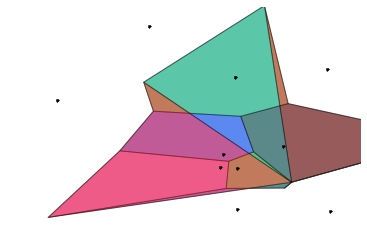

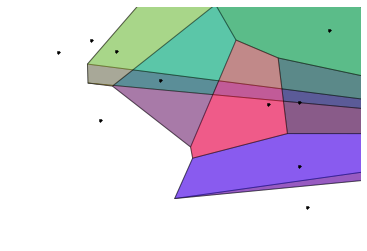

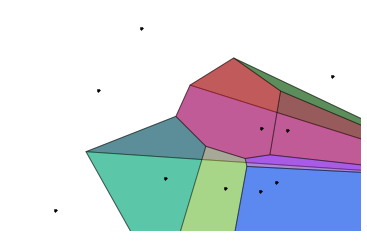

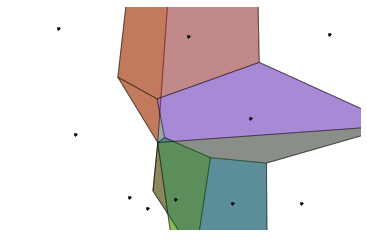

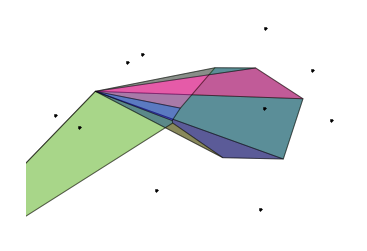

...

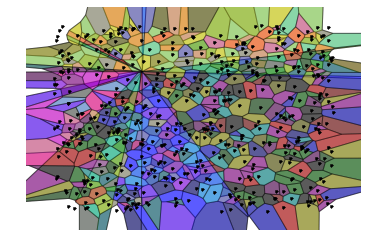

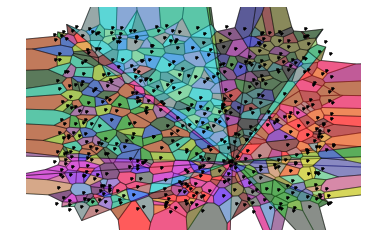

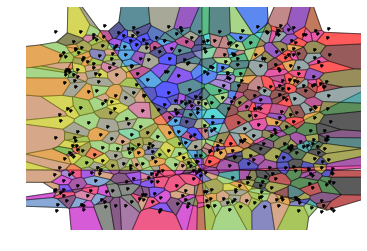

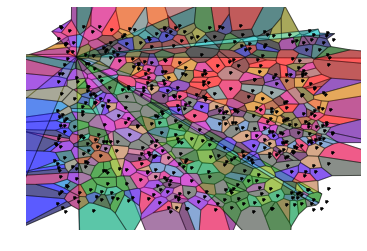

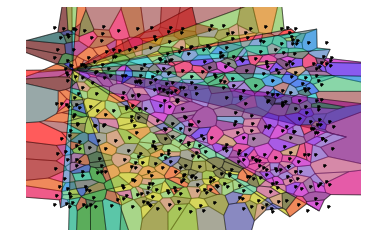

In [94]:
for size in [10,50,100,500]:
    for n in np.arange(10):
        points = np.random.rand(size, 2)#100
        vor = Voronoi(points)
        regions, vertices = voronoi_finite_polygons_2d(vor)
        # colorize
        for region in regions:
            polygon = vertices[region]
            plt.fill(*zip(*polygon), alpha=0.4)
        plt.axis("off")
        plt.plot(points[:,0], points[:,1], '.',color="black")
        plt.xlim(vor.min_bound[0] - 0.1, vor.max_bound[0] + 0.1)
        plt.ylim(vor.min_bound[1] - 0.1, vor.max_bound[1] + 0.1)
        plt.savefig("vorioni{0}_{1}.png".format(n,size))
        plt.show()

In [3]:
import os

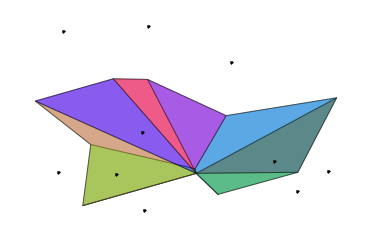

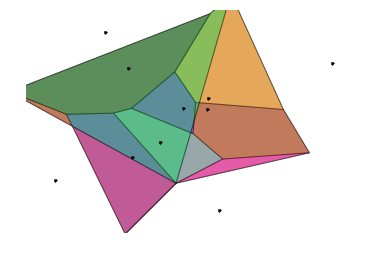

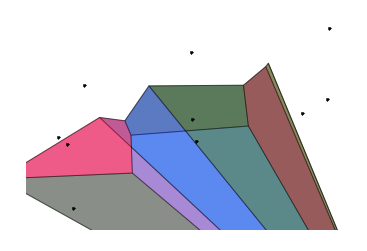

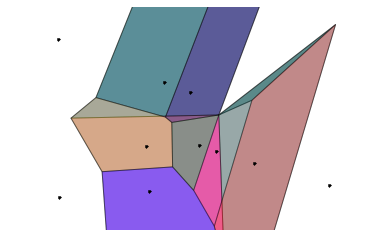

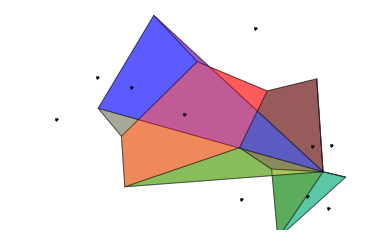

...

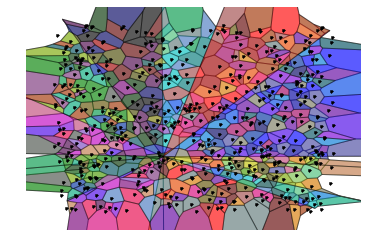

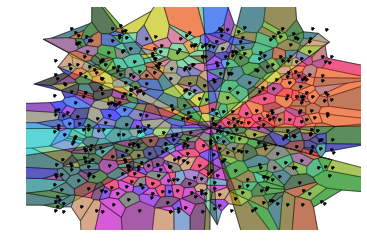

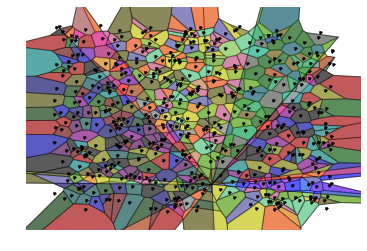

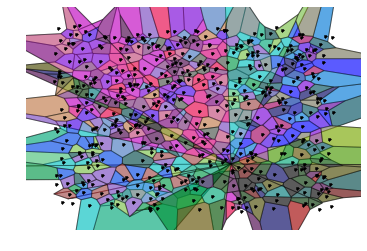

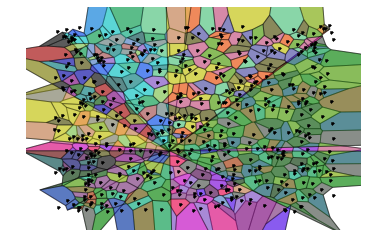

In [6]:
for size in [10,20,30,50,60,70,100,200,300,500]:
    os.mkdir("vorioni{}".format(size))
    for n in np.arange(10):
        plt.figure()
        points = np.random.rand(size, 2)#100
        vor = Voronoi(points)
        regions, vertices = voronoi_finite_polygons_2d(vor)
        # colorize
        for region in regions:
            polygon = vertices[region]
            plt.fill(*zip(*polygon), alpha=0.4)
        plt.axis("off")
        plt.plot(points[:,0], points[:,1], '.',color="black")
        plt.xlim(vor.min_bound[0] - 0.1, vor.max_bound[0] + 0.1)
        plt.ylim(vor.min_bound[1] - 0.1, vor.max_bound[1] + 0.1)
        plt.savefig("vorioni{1}/vorioni_{0}.png".format(n,size))

In [ ]:
for size in [10,20,30,50,60,70,100,200,300,500]:
#     os.mkdir("vorioni{}".format(size))
    for n in np.arange(2):
        plt.figure()
        points = np.random.rand(size, 2)#100
        vor = Voronoi(points)
        regions, vertices = voronoi_finite_polygons_2d(vor)
        # colorize
        for region in regions:
            polygon = vertices[region]
            plt.fill(*zip(*polygon), alpha=0.4)
        plt.axis("off")
        plt.plot(points[:,0], points[:,1], '.',color="black")
        plt.xlim(vor.min_bound[0] - 0.1, vor.max_bound[0] + 0.1)
        plt.ylim(vor.min_bound[1] - 0.1, vor.max_bound[1] + 0.1)
        plt.savefig("vorioni_good/vorioni_{0}.png".format(n,size))

#### Credit 

- https://www.youtube.com/watch?v=gEwzDydciWc
- http://jakevdp.github.io/blog/2013/05/12/embedding-matplotlib-animations/
- http://jakevdp.github.io/blog/2013/05/12/embedding-matplotlib-animations/
- http://zulko.github.io/blog/2014/11/29/data-animations-with-python-and-moviepy/
- http://stackoverflow.com/questions/20515554/colorize-voronoi-diagram